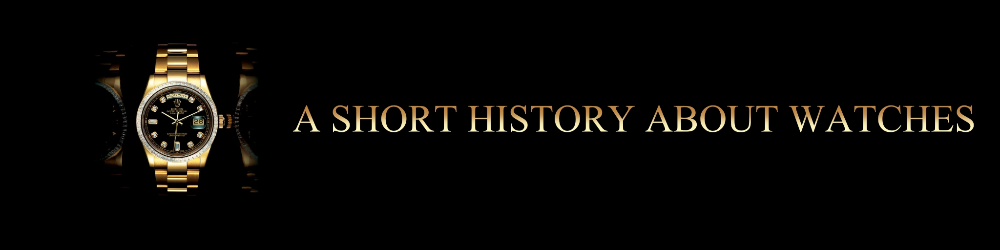

**Luxury watches have become more and more popular among affluent people as investments in their portfolios, which has increased demand and, consequently, value in the watch market. Prior to the pandemic, the watch industry witnessed an unprecedented surge in demand for high-end luxury timepieces, with some fetching six figures for their purchase.**

**It wasn't always this way, despite the industry's recent dramatic growth. For this reason, we have chosen to examine the worth of watches and the performance of the various brands over time.**

**ASPECTS TO COVER**
 - First wristwatches commercially made
 - Most expensive watches and a bit about their history
 - Ideal case size over time
 - Number of watches released per year and price correlation
 - Evolution of price since first commercial release

**STEPS TO TAKE**
 - Data cleaning and formatting – looking for duplicates and null values to eliminate
 - Formatting column names
 - Data formatting – change column type to a more usable format where necessary
 - Perform analysis on specific columns
 - Create visualisations
 - Extract data to be vizualised

# **DATA CLEANSING AND FORMATTING**

In [1]:
import pandas as pd  # Importing pandas library for data manipulation
import numpy as np   # Importing numpy library for numerical operations
import matplotlib.pyplot as plt  # Importing matplotlib library for data visualization

In [3]:
# Reading the CSV file into a pandas DataFrame
df = pd.read_csv('/Users/alexandermanta/Desktop/The Watch Project/Raw Data/Watches.csv')

/var/folders/t1/19mjcn6s65x1_r3vk1964d8r0000gn/T/ipykernel_2153/1798722664.py:2: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/Users/alexandermanta/Desktop/The Watch Project/Raw Data/Watches.csv')


In [4]:
# Setting data type options for specific columns
dtype_options = {'size': 'object'}

In [5]:
# Displaying the first few rows of the DataFrame
df.head()

,Unnamed: 0,name,price,brand,model,ref,mvmt,casem,bracem,yop,cond,sex,size,condition
0,0,Audemars Piguet Royal Oak Offshore Chronograph...,"$43,500",Audemars Piguet,Royal Oak Offshore Chronograph,26237ST.OO.1000ST.01,NaN,NaN,NaN,2019,Unworn,Men's watch/Unisex,42 mm,NaN
1,1,Audemars Piguet Royal Oak Selfwinding\n39mm Bl...,"$71,500",Audemars Piguet,Royal Oak Selfwinding,15300ST.OO.1220ST.02,NaN,NaN,NaN,2012,Very good,Men's watch/Unisex,39 mm,NaN
2,2,Audemars Piguet Royal Oak Chronograph\nBlue Di...,"$79,191",Audemars Piguet,Royal Oak Chronograph,26331ST,Automatic,Steel,Steel,Unknown,Unworn,NaN,41 mm,NaN
3,3,Audemars Piguet Royal Oak Chronograph\nSelfwin...,"$108,000",Audemars Piguet,Royal Oak Chronograph,26715ST.OO.1356ST.01,Automatic,Steel,Steel,2022 (Approximation),New,Men's watch/Unisex,38 mm,NaN
4,4,Audemars Piguet Royal Oak Offshore Chronograph...,"$27,500",Audemars Piguet,Royal Oak Offshore Chronograph,26170ST.OO.1000ST.01,Automatic,Steel,Steel,Unknown,Very good,Men's watch/Unisex,42 x 54 mm,NaN


In [6]:
# Displaying information about the DataFrame, including the data types and non-null counts
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284491 entries, 0 to 284490
Data columns (total 14 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  284491 non-null  int64 
 1   name        211906 non-null  object
 2   price       284085 non-null  object
 3   brand       284360 non-null  object
 4   model       254025 non-null  object
 5   ref         241339 non-null  object
 6   mvmt        87806 non-null   object
 7   casem       120220 non-null  object
 8   bracem      109595 non-null  object
 9   yop         284357 non-null  object
 10  cond        208504 non-null  object
 11  sex         188686 non-null  object
 12  size        260894 non-null  object
 13  condition   71569 non-null   object
dtypes: int64(1), object(13)
memory usage: 30.4+ MB


In [7]:
# Printing the column names of the DataFrame
print(df.columns)

Index(['Unnamed: 0', 'name', 'price', 'brand', 'model', 'ref', 'mvmt', 'casem',
       'bracem', 'yop', 'cond', 'sex', 'size', 'condition'],
      dtype='object')


In [8]:
# Dropping specified columns from the DataFrame
df.drop(['name', 'mvmt', 'casem', 'bracem', 'cond', 'condition'], axis=1, inplace=True)

In [9]:
# Renaming the index column in the DataFrame
df.rename({"Unnamed: 0": "Index"}, axis="columns", inplace=True)

In [10]:
# Dropping an index column from the DataFrame
df.drop('Index', axis=1, inplace=True)

In [11]:
# Reordering the columns in the DataFrame
df = df.reindex(columns=['brand', 'model', 'price', 'ref', 'yop', 'sex', 'size'])

In [12]:
# Filtering rows where 'yop' column is unknown
filtered_rows = df[df['yop'] == 'Unknown']

# Counting the occurrences of each value in the 'yop' column for filtered rows to help with decision to drop the values or not
value_counts = filtered_rows['yop'].value_counts()
print(value_counts)

yop
Unknown    95957
Name: count, dtype: int64


In [13]:
# Checking for null values in the DataFrame
df.isnull().sum()  # The null values will be removed after the 1st task

brand      131
model    30466
price      406
ref      43152
yop        134
sex      95805
size     23597
dtype: int64

In [14]:
# Extracting year values from 'yop' column
df['yop'] = df['yop'].str.extract(r'(\d{4})')

In [15]:
# Extracting size values from 'size' column
df['size'] = df['size'].str.extract(r'(\d{2})')

In [16]:
# Removing special characters
df['price'] = df['price'].str.replace('$', '').str.replace(',', '')

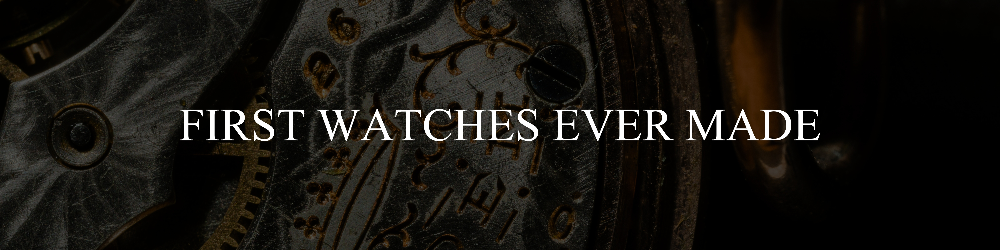

In [17]:
# Converting 'price' column to numeric type
df['price'] = pd.to_numeric(df['price'], errors='coerce')

In [18]:
df['price'] = df['price'].astype('Int64')

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284491 entries, 0 to 284490
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   brand   284360 non-null  object
 1   model   254025 non-null  object
 2   price   269826 non-null  Int64 
 3   ref     241339 non-null  object
 4   yop     188400 non-null  object
 5   sex     188686 non-null  object
 6   size    260831 non-null  object
dtypes: Int64(1), object(6)
memory usage: 15.5+ MB


In [20]:
# Converting 'yop' column to numeric type
df['yop'] = pd.to_numeric(df['yop'], errors='coerce')

In [21]:
df['yop'] = df['yop'].astype('Int64')

In [22]:
# Converting 'size' column to numeric type
df['size'] = pd.to_numeric(df['size'], errors='coerce')

In [23]:
df['size'] = df['size'].astype('Int64')

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284491 entries, 0 to 284490
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   brand   284360 non-null  object
 1   model   254025 non-null  object
 2   price   269826 non-null  Int64 
 3   ref     241339 non-null  object
 4   yop     188400 non-null  Int64 
 5   sex     188686 non-null  object
 6   size    260830 non-null  Int64 
dtypes: Int64(3), object(4)
memory usage: 16.0+ MB


In [25]:
# Dropping rows with null values
df_first_watches = df.dropna()
df_first_watches.head()

,brand,model,price,ref,yop,sex,size
0,Audemars Piguet,Royal Oak Offshore Chronograph,43500,26237ST.OO.1000ST.01,2019,Men's watch/Unisex,42
1,Audemars Piguet,Royal Oak Selfwinding,71500,15300ST.OO.1220ST.02,2012,Men's watch/Unisex,39
3,Audemars Piguet,Royal Oak Chronograph,108000,26715ST.OO.1356ST.01,2022,Men's watch/Unisex,38
5,Audemars Piguet,Royal Oak Offshore Diver,41000,15710ST.OO.A051CA.01,2018,Men's watch/Unisex,42
6,Audemars Piguet,Royal Oak Offshore Diver Chronograph,43500,26703ST.OO.A051CA.01,2016,Men's watch/Unisex,42


In [26]:
# Sorting the data by year in ascending order
df_first_watches = df_first_watches.sort_values(by='yop', ascending=True)

In [27]:
# Updating incorrect values to the correct years from 'yop' column
df_first_watches.loc[df_first_watches['yop'] == 1694, 'yop'] = 2007
df_first_watches.loc[df_first_watches['yop'] == 1790, 'yop'] = 1966
df_first_watches.loc[df_first_watches['yop'] == 1884, 'yop'] = 2007
df_first_watches.loc[df_first_watches['yop'] == 1900, 'yop'] = 1971


In [28]:
df_first_watches.head()

,brand,model,price,ref,yop,sex,size
114037,Omega,Seamaster,1243,165.002,2007,Men's watch/Unisex,34
115679,Omega,Constellation,4902,168.009,1966,Men's watch/Unisex,37
13812,Breitling,Colt Chronograph,2185,A73380,2007,Men's watch/Unisex,41
120780,Omega,Genève,650,121.1740,1971,Men's watch/Unisex,48
74712,Jaeger-LeCoultre,Reverso,11271,Reverso Vintage,1930,Men's watch/Unisex,32


In [29]:
# Sorting the data by year in ascending order
df_first_watches = df_first_watches.sort_values(by='yop', ascending=True)

In [30]:
df_first_watches.head()

,brand,model,price,ref,yop,sex,size
74712,Jaeger-LeCoultre,Reverso,11271,Reverso Vintage,1930,Men's watch/Unisex,32
144792,Patek Philippe,Calatrava,5815,3919,1930,Men's watch/Unisex,34
75245,Jaeger-LeCoultre,Reverso Classique,34499,250.1.86,1931,Men's watch/Unisex,24
146802,Patek Philippe,Calatrava,25641,96,1935,Men's watch/Unisex,31
145915,Patek Philippe,Calatrava,33063,96,1937,Men's watch/Unisex,30


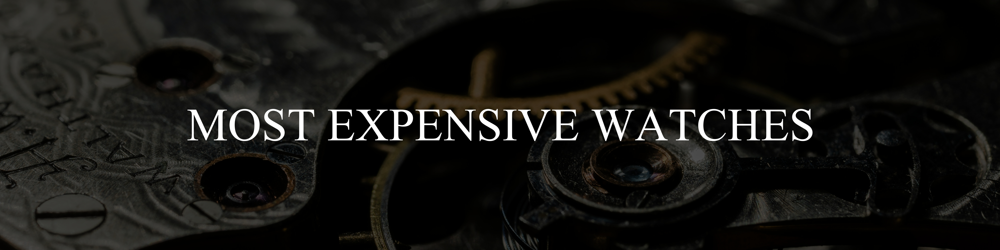

In [31]:
# Sorting the most expensive watches for visualization
df_most_expensive = df.sort_values(by='price', ascending=False)

In [32]:
df_most_expensive.head(20)

,brand,model,price,ref,yop,sex,size
145835,Patek Philippe,Grandmaster Chime,9000000,6300G-010,<NA>,Men's watch/Unisex,<NA>
144624,Patek Philippe,Sky Moon Tourbillon,8778828,6002R-001,2022,Men's watch/Unisex,<NA>
142461,Patek Philippe,Sky Moon Tourbillon,7300000,6002R-001,<NA>,Men's watch/Unisex,60
144632,Patek Philippe,Grand Complications,6726634,NaN,2022,Men's watch/Unisex,<NA>
139946,Patek Philippe,Minute Repeater Perpetual Calendar,6410714,5374P-001,2023,Men's watch/Unisex,42
143239,Patek Philippe,Celestial,4500000,NaN,2020,Men's watch/Unisex,<NA>
249872,Richard Mille,NaN,4450000,NaN,2018,Men's watch/Unisex,<NA>
145888,Patek Philippe,Minute Repeater,4350000,6301P-001,<NA>,Men's watch/Unisex,44
248979,Richard Mille,NaN,4295448,NaN,<NA>,Men's watch/Unisex,<NA>
142445,Patek Philippe,NaN,3990234,6301P,2023,Men's watch/Unisex,<NA>


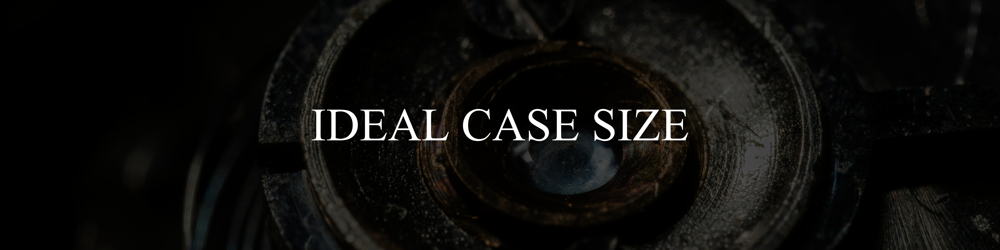

In [33]:
# Creating a cleaned DataFrame by dropping the null values
df_cleaned = df.dropna()

In [34]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86566 entries, 0 to 284489
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   brand   86566 non-null  object
 1   model   86566 non-null  object
 2   price   86566 non-null  Int64 
 3   ref     86566 non-null  object
 4   yop     86566 non-null  Int64 
 5   sex     86566 non-null  object
 6   size    86566 non-null  Int64 
dtypes: Int64(3), object(4)
memory usage: 5.5+ MB


In [35]:
df_cleaned.head()

,brand,model,price,ref,yop,sex,size
0,Audemars Piguet,Royal Oak Offshore Chronograph,43500,26237ST.OO.1000ST.01,2019,Men's watch/Unisex,42
1,Audemars Piguet,Royal Oak Selfwinding,71500,15300ST.OO.1220ST.02,2012,Men's watch/Unisex,39
3,Audemars Piguet,Royal Oak Chronograph,108000,26715ST.OO.1356ST.01,2022,Men's watch/Unisex,38
5,Audemars Piguet,Royal Oak Offshore Diver,41000,15710ST.OO.A051CA.01,2018,Men's watch/Unisex,42
6,Audemars Piguet,Royal Oak Offshore Diver Chronograph,43500,26703ST.OO.A051CA.01,2016,Men's watch/Unisex,42


In [36]:
# Calculating and displaying the mean size of watches by gender
df_cleaned.groupby('sex')['size'].mean()

sex
Men's watch/Unisex    40.945956
Women's watch         31.295669
Name: size, dtype: Float64

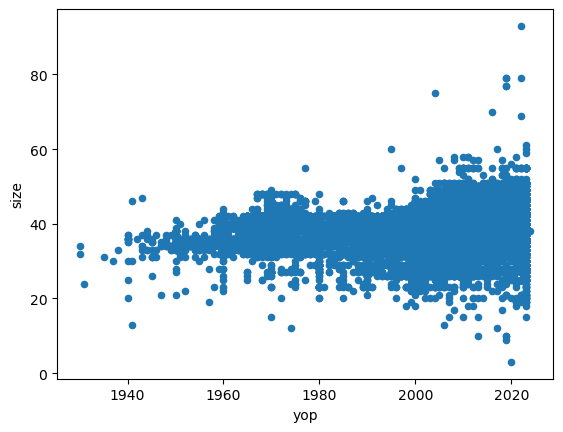

In [37]:
# Plotting scatter plots for size vs. year of production for different genders
df_first_watches[df_first_watches['sex'] == "Men's watch/Unisex"].plot(x='yop', y='size', kind='scatter');

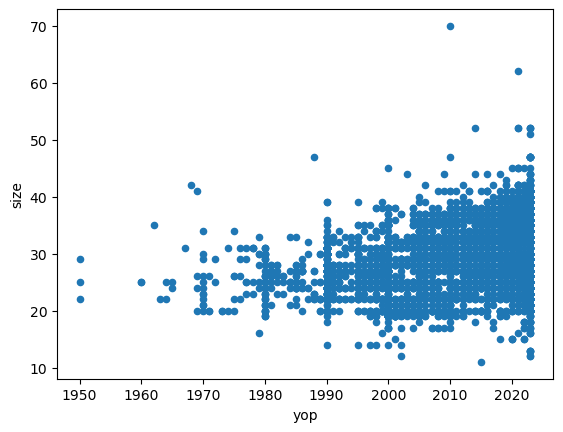

In [38]:
df_first_watches[df_first_watches['sex'] == "Women's watch"].plot(x='yop', y='size', kind='scatter');

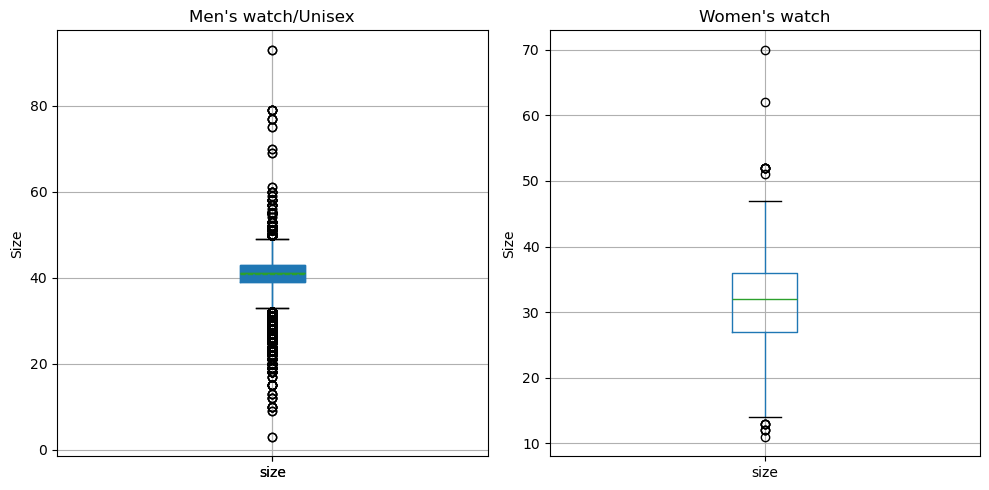

In [40]:
# Plotting boxplots for size distribution by gender
ideal_size = df_cleaned.groupby('sex')['size'].mean()
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
box = df_cleaned[df_cleaned['sex'] == df_cleaned['sex'].iloc[0]].boxplot(column='size', ax=axes[0], patch_artist=True, meanline=True, showmeans=True)
for i, sex in enumerate(ideal_size.index):
    df_cleaned[df_cleaned['sex'] == sex].boxplot(column='size', ax=axes[i])
    axes[i].set_title(sex)
    axes[i].set_ylabel('Size')

plt.tight_layout()
plt.show()

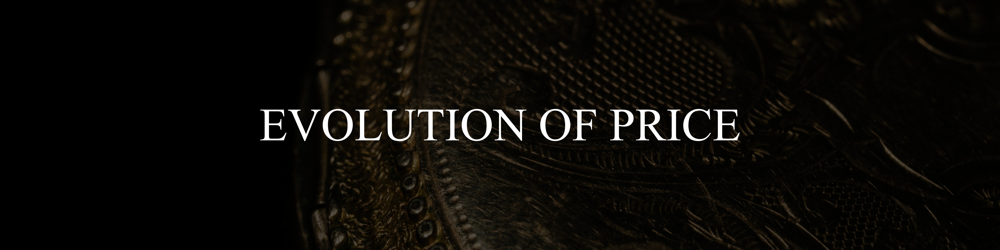

In [41]:
# Creating 5-year intervals for 'yop' column and calculating average prices for specific brands
df['5_year_interval'] = df['yop'] // 5 * 5

In [42]:
most_expensive_PF = df[df['brand'] == 'Patek Philippe'].groupby('5_year_interval')['price'].mean()
most_expensive_AP = df[df['brand'] == 'Audemars Piguet'].groupby('5_year_interval')['price'].mean()
most_expensive_RM = df[df['brand'] == 'Richard Mille'].groupby('5_year_interval')['price'].mean()

In [43]:
# Saving average prices for Patek Philippe into a CSV file
df[df['brand'] == 'Patek Philippe'].groupby('5_year_interval')['price'].mean()

5_year_interval
1845     46592.333333
1850          99189.0
1865          24740.0
1870           9006.0
1875          17045.0
1880     28308.714286
1885          38042.4
1890     13110.454545
1895           9646.0
1900     11467.266667
1905          12516.2
1910      9891.090909
1915     22116.833333
1920     16608.583333
1925     22695.285714
1930          12795.0
1935     41228.533333
1940     25806.181818
1945     32903.038462
1950     32803.315789
1955     22171.966667
1960     18791.938272
1965     57687.888889
1970     15437.241935
1975     79916.439394
1980     80071.292035
1985     50785.017544
1990          46565.1
1995     45823.745763
2000     49902.665714
2005     80922.727569
2010      98014.55082
2015    134999.515501
2020    145029.339023
Name: price, dtype: Float64

In [44]:
result_df_PF = df[df['brand'] == 'Patek Philippe'].groupby('5_year_interval')['price'].mean()

In [45]:
result_df_PF.to_csv('patek_philippe_prices.csv', header=True)

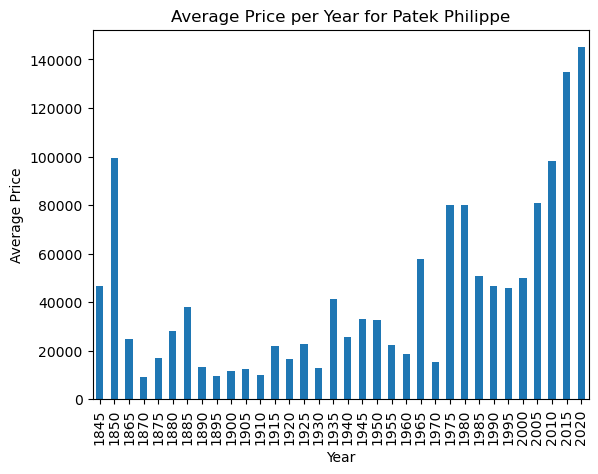

In [46]:
# Plotting bar chart for average price per year for Patek Philippe
fig, ax = plt.subplots()

most_expensive_PF.plot(kind='bar', ax=ax)
plt.xlabel('Year')
plt.ylabel('Average Price')
plt.title('Average Price per Year for Patek Philippe')


plt.show()

In [47]:
# Saving average prices for Audemars Piguet into a CSV file
df[df['brand'] == 'Audemars Piguet'].groupby('5_year_interval')['price'].mean()

5_year_interval
1885         11476.0
1905          3450.0
1910         27738.0
1920    14831.333333
1925          5052.0
1940          8670.0
1945         11383.5
1950         10497.0
1955         16799.0
1960     6861.526316
1965          9177.0
1970    76686.626866
1975    64570.873418
1980    34477.149701
1985       41204.375
1990    39928.405109
1995    67491.075269
2000    55456.753927
2005    53154.587774
2010    53541.148338
2015      81253.2216
2020    99307.383825
Name: price, dtype: Float64

In [48]:
result_df_AP = df[df['brand'] == 'Audemars Piguet'].groupby('5_year_interval')['price'].mean()

In [49]:
result_df_AP.to_csv('audemars_piguet_prices.csv', header=True)

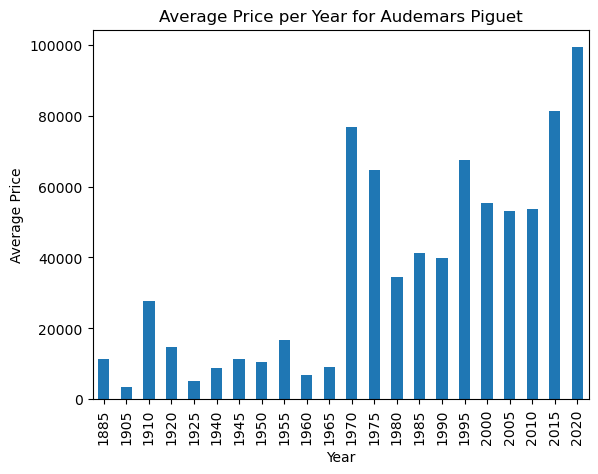

In [50]:
# Plotting bar chart for average price per year for Audemars Piguet
fig, ax = plt.subplots()

most_expensive_AP.plot(kind='bar', ax=ax)
plt.xlabel('Year')
plt.ylabel('Average Price')
plt.title('Average Price per Year for Audemars Piguet')

plt.show()

In [51]:
# Creating 2-year intervals for 'yop' column and calculating average prices for Richard Mille as there in not enough data to be done on a 5 year interval
df['2_year_interval'] = df['yop'] // 2 * 2

In [52]:
df[df['brand'] == 'Richard Mille'].groupby('2_year_interval')['price'].mean()

2_year_interval
2000         317577.0
2002             <NA>
2004    204221.285714
2006    144064.888889
2008    170489.133333
2010       275427.625
2012    325805.366667
2014    287621.039216
2016    311863.065421
2018    452088.949367
2020    389185.303279
2022    527671.479592
Name: price, dtype: Float64

In [53]:
result_df_RM = df[df['brand'] == 'Richard Mille'].groupby('2_year_interval')['price'].mean()

In [54]:
# Saving average prices for Richard Mille into a CSV file
result_df_RM.to_csv('richard_mille_prices.csv', header=True)

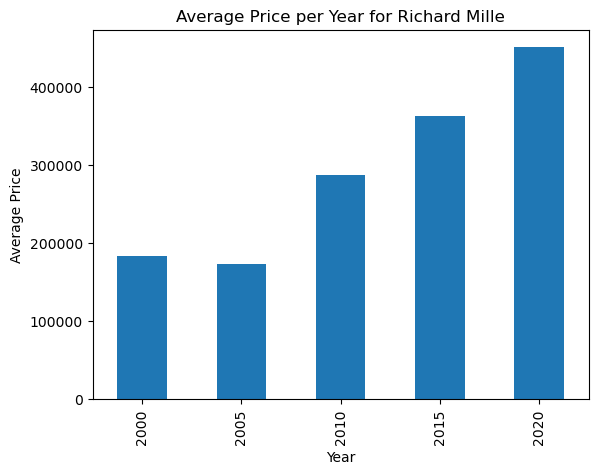

In [55]:
# Plotting bar chart for average price per year for Richard Mille
fig, ax = plt.subplots()

most_expensive_RM.plot(kind='bar', ax=ax)
plt.xlabel('Year')
plt.ylabel('Average Price')
plt.title('Average Price per Year for Richard Mille')

plt.show()